# Processing Data


In [1]:
# ruff: noqa: E402

%load_ext autoreload
%autoreload 2

# find the root of the project
import os
from pathlib import Path
import sys
import polars as pl
import dotenv


ROOT = Path(os.getcwd()).parent
while not ROOT.joinpath(".git").exists():
    ROOT = ROOT.parent

# add the root to the python path
sys.path.append(str(ROOT))


dotenv.load_dotenv(ROOT.joinpath(".env"))

from src.utils import check_gpu_available

GPU = check_gpu_available()
print(f"GPU available: {GPU}")

/home/max/Development/roadside-radar/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU available: True


## Load the Network


In [2]:
import geopandas as gpd
from src.geometry import RoadNetwork


mainline_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=["EBL1", "WBL1"],
    step_size=0.01,
)

full_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=None,
    step_size=0.01,
)

LANE_WIDTH = 3.55
LANE_NUM = 2

## Read in the Trajectories


In [3]:
from datetime import timedelta
import polars as pl
from src.radar import CalibratedRadar
from src.pipelines.open_file import prep_df


USE_FRONT = False


radar_obj = CalibratedRadar(
    radar_location_path=ROOT / "configuration" / "october_calibrated.yaml",
)


radar_df = (
    pl.scan_parquet(
        Path(os.environ.get("RAW_DATA_DIR")).joinpath("*.parquet"),
    )
    .with_columns(
        pl.col("epoch_time").dt.replace_time_zone("UTC"),
    )
    .filter(pl.col("epoch_time").dt.month() == 10)
    .filter(
        pl.col("epoch_time").is_between(
            pl.lit("2023-10-31 11:40:00")
            .str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            )
            .dt.convert_time_zone("UTC"),
            pl.lit("2023-10-31 13:00:00")
            .str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            )
            .dt.convert_time_zone("UTC"),
        )
    )
    .with_columns(
        (pl.col("f32_positionX_m") ** 2 + pl.col("f32_positionY_m") ** 2)
        .sqrt()
        .alias("dist"),
    )
    .filter(
        pl.when(pl.col("ip").is_in(["10.160.7.141", "10.160.7.137"]))
        .then(pl.col("dist") < 250)
        .otherwise(pl.lit(True))
    )
    # mark whether approaching or receding
    .collect()
    .lazy()
    .pipe(prep_df, f=radar_obj)
    .pipe(
        mainline_net.map_to_lane,
        dist_upper_bound=LANE_WIDTH * LANE_NUM
        - (LANE_WIDTH / 2)
        + 0.5,  # centered on one of the lanes,
        utm_x_col="utm_x",
        utm_y_col="utm_y",
    )
    .filter(pl.col("name").is_not_null())
    .rename(
        {
            "name": "lane",
            "angle": "heading_lane",
        }
    )
    .with_columns(
        (pl.col("dist").diff().backward_fill(1).over("object_id") < 0).alias(
            "approaching"
        )
    )
)

function: create_object_id took: 0.0002827644348144531 seconds
function: filter_short_trajectories took: 0.0003952980041503906 seconds
function: clip_trajectory_end took: 0.0002522468566894531 seconds
function: resample took: 0.00024390220642089844 seconds
function: fix_duplicate_positions took: 0.00015664100646972656 seconds
function: set_timezone took: 4.124641418457031e-05 seconds
function: add_cst_timezone took: 2.86102294921875e-05 seconds
function: add_heading took: 2.956390380859375e-05 seconds
function: rotate_radars took: 0.0005061626434326172 seconds
function: update_origin took: 0.0005192756652832031 seconds


In [4]:
from src.pipelines.kalman_filter import (
    prepare_frenet_measurement,
    build_extension,
    add_timedelta,
    build_kalman_id,
    filter_short_trajectories,
)

radar_df = (
    radar_df.pipe(
        filter_short_trajectories, minimum_distance_m=10, minimum_duration_s=2
    )
    .pipe(prepare_frenet_measurement)
    .pipe(build_extension, seconds=3)
    .pipe(add_timedelta)
    .pipe(build_kalman_id, split_time_delta=1)
    .collect()
)

function: filter_short_trajectories took: 0.1119992733001709 seconds
function: prepare_frenet_measurement took: 0.002028942108154297 seconds
function: build_extension took: 1.2201194763183594 seconds
function: add_timedelta took: 0.0002617835998535156 seconds
function: build_kalman_id took: 0.0002636909484863281 seconds


In [5]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     radar_df
#     .with_columns((pl.col("s") + pl.col('distanceToFront_s')).alias("s"))
#     .pipe(radar_obj.add_cst_timezone)
#     .filter(
#     #     pl.col("epoch_time_cst").is_between(
#     #         pl.lit("2023-03-13 06:50:00").str.strptime(pl.Datetime(time_unit="ns", time_zone='US/Central'), ),
#     #         pl.lit("2023-03-13 06:59:00").str.strptime(pl.Datetime(time_unit="ns", time_zone='US/Central'), ),
#     #     )
#         (pl.col("lane").str.contains("E"))
#         # & (pl.col("lane_index") == 0)
#     )
#     .with_columns(
#         (pl.col('s').max() - pl.col('s')).alias('s'),
#     )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="object_id",
#     s_col="s",
#     markers=True,
#     fig=fig,
# )

# fig.update_layout()


# fig.show()

In [6]:
# radar_df[["s", "s_velocity", "d", "d_velocity"]].describe()

In [7]:
from src.pipelines.kalman_filter import build_kalman_df

filter_df = (
    radar_df
    # .with_columns((pl.col("distanceToFront_s") + pl.col("s")).alias("front_s"))
    .pipe(build_kalman_df, s_col="front_s" if USE_FRONT else "s")
    .filter(
        pl.col("max_time") < pl.col("max_time").max()  # filter out the outlier times
    )
    .collect()
)

function: build_kalman_df took: 0.0014986991882324219 seconds


### IMM Filter the Radar Trajectories


In [8]:
filter_df.group_by("vehicle_ind").agg(pl.col("time_ind").max())["time_ind"].describe()

statistic,value
str,f64
"""count""",17048.0
"""null_count""",0.0
"""mean""",133.027335
"""std""",74.703377
"""min""",29.0
"""25%""",90.0
"""50%""",119.0
"""75%""",155.0
"""max""",879.0


In [9]:
from src.filters.vectorized_kalman import batch_imm_df
import numpy as np

filt_df = batch_imm_df(
    filter_df.rename({"measurement": "z"}),
    filters=("CALC", "CALK", "CVLK"),
    # M=np.array([[0.9, 0.05, 0.05], [0.05, 0.9, 0.05], [0.05, 0.05, 0.9]]),
    M=np.array([[0.6, 0.2, 0.2], [0.2, 0.6, 0.2], [0.2, 0.2, 0.6]]),
    mu=np.array([0.1, 0.8, 0.1]),
    # chunk_size=3_500,
    chunk_size=800 if not GPU else 15_000,
    gpu=GPU,
)

  0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 2/2 [00:25<00:00, 12.56s/it]


In [10]:
from src.pipelines.kalman_filter import join_results

joined_df = join_results(filt_df, filter_df, radar_df)

if USE_FRONT:
    joined_df = joined_df.rename({"s": "front_s"})

joined_df = joined_df.collect()

function: join_results took: 0.001064300537109375 seconds


## Plotting the Lanes


In [11]:
# import matplotlib.pyplot as plt

# fig, ax = plt.subplots(figsize=(10, 5))

# joined_df.filter(pl.col("lane").str.contains("W") & pl.col("d").is_between(-6, 6))[
#     ["d"]
# ].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5)

# ax.set_xlim(-5, 6)

(-5.0, 6.0)

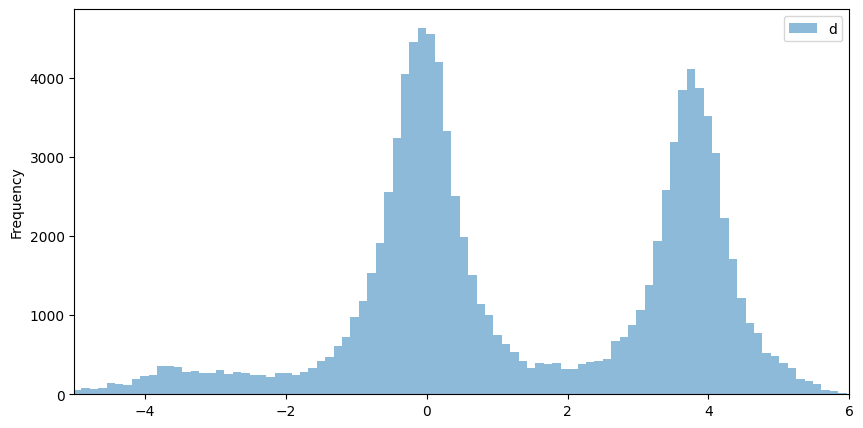

In [12]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 5))

joined_df.filter(pl.col("lane").str.contains("E") & pl.col("d").is_between(-6, 6))[
    ["d"]
].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5)

ax.set_xlim(-5, 6)

### Classify the Lanes


In [13]:
from src.pipelines.lane_classification import label_lane, label_lanes_tree
from src.gmm.lane_classification import build_lane_model
from src.plotting.lane_gmm import plot_model

In [14]:
res = joined_df.pipe(
    label_lanes_tree,
    full_network=full_net,
    kalman_network=mainline_net,
    lane_width=LANE_WIDTH,
    s_col="front_s" if USE_FRONT else "s",
)


res.filter(pl.col("lane_index").is_null()).shape[0] / res.shape[0]

res = res.with_columns(pl.col("lane_index").fill_null(2))

/tmp/ipykernel_1065950/915200866.py:7: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  ).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, by="lane_index")


(-5.0, 6.0)

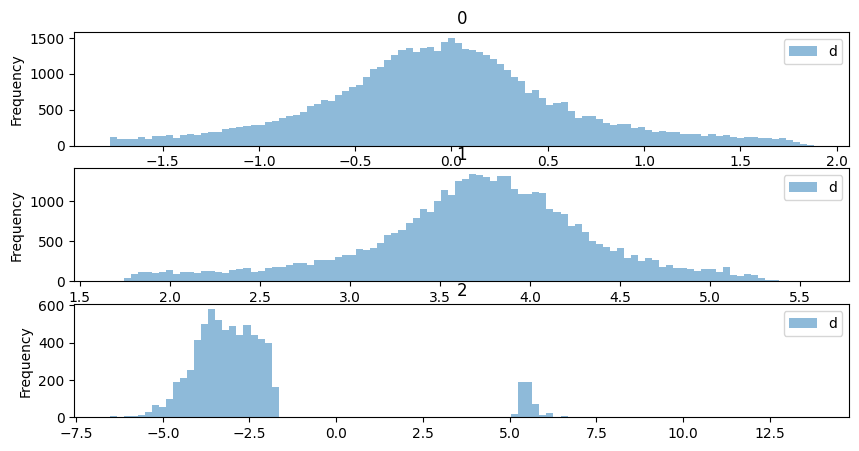

In [15]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 5))

res.filter(pl.col("lane").str.contains("E"))[["d", "lane_index"]].sample(
    100_000
).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, by="lane_index")

ax.set_xlim(-5, 6)

In [16]:
joined_df = res.filter(pl.col("lane_index") <= 1)

## Save the Kalman Filtered Trajectories

In [17]:
# (
#     joined_df
#     .pipe(
#         add_front_back_s,
#         use_nearest_length=True,
#     )
# )

In [18]:
from src.pipelines.association import build_leader_follower_df, add_front_back_s

save_df = (
    joined_df
    # .pipe(
    #     add_front_back_s,
    #     use_nearest_length=True,
    # )
    .select(
        [
            "epoch_time",
            "object_id",
            # # (pl.col("front_s") - pl.col('distanceToFront_s')).alias('centroid_s'),
            # (pl.col('front_s') + pl.col('distanceToFront_s')).alias("front_s"),
            # (pl.col('front_s') - pl.col('length_s')).alias("back_s"),
            # 'front_s',
            # 'back_s',
            pl.col("s").alias("centroid_s"),
            (pl.col("s") + pl.col("distanceToFront_s")).alias("front_s"),
            (pl.col("s") + pl.col("distanceToBack_s")).alias("back_s"),
            "s_velocity",
            "d",
            "d_velocity",
            "lane",
            "lane_index",
            "prediction",
            "missing_data",
        ]
    )
)


# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s", "d", "front_x", "front_y"),
    ("back_s", "d", "back_x", "back_y"),
    ("centroid_s", "d", "centroid_x", "centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    save_df = (
        save_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )


save_df.write_parquet(
    ROOT.joinpath("data", "october_kalman.parquet"),
)

## Merge the Trajectories


In [19]:
from src.pipelines.association import build_leader_follower_df, add_front_back_s

joined_df = (
    joined_df.lazy()
    .pipe(
        add_front_back_s, use_median_length=False, s_col="front_s" if USE_FRONT else "s"
    )
    .collect()
)


lf_df = (
    joined_df.lazy().pipe(
        build_leader_follower_df, s_col="front_s" if USE_FRONT else "s"
    )
    # only consider vehicles that are fairly close
    .filter(pl.col("s_gap") < 20)
    # don't keep matches that are both prediction
    .filter(~(pl.col("prediction") & pl.col("prediction_leader")))
    # .filter()
    # assumption that radar tracks perfectly
    .filter((pl.col("ip") != pl.col("ip_leader")) | (pl.col("s_velocity") > 15))
    # .filter(pl.col("s_velocity") > 5)
    .collect()
)

function: add_front_back_s took: 0.0003066062927246094 seconds
function: lazy_func took: 0.0012750625610351562 seconds


In [20]:
# lf_df

### Calculate the Association Log-Likelihood Distance


In [21]:
from src.pipelines.association import calc_assoc_liklihood_distance

lf_df = lf_df.pipe(calc_assoc_liklihood_distance, gpu=GPU, dims=2)

function: lazy_func took: 0.5924603939056396 seconds


### Calculate the Match Indexes


In [22]:
from scipy.stats import chi
from src.pipelines.association import (
    calculate_match_indexes,
    pipe_gate_headway_calc,
    build_match_df,
)

assoc1_df = (
    lf_df.pipe(calculate_match_indexes, match_time_threshold=10)
    .pipe(pipe_gate_headway_calc, alpha=0.9)
    .collect()
)

match_df = (
    assoc1_df.lazy()
    .pipe(
        build_match_df,
        traj_time_df=joined_df.group_by("object_id")
        .agg(
            pl.col("epoch_time").max().alias("epoch_time_max"),
        )
        .lazy(),
        assoc_cutoff=chi.ppf(0.99, 2),
        assoc_cutoff_pred=chi.ppf(0.99, 2),
    )
    .collect()
)


1 - 0.9875

function: lazy_func took: 0.0009009838104248047 seconds
function: lazy_func took: 0.0002040863037109375 seconds
function: lazy_func took: 0.06026959419250488 seconds


0.012499999999999956

In [23]:
# this is stupid
if "assoc_df" in locals():
    objs = assoc_df.filter(pl.col("vehicle_id").is_in([4714, 1705]))[
        "object_id"
    ]  # noqa: F821

    lf_df.filter(pl.col("object_id").is_in(objs) | pl.col("leader").is_in(objs)).filter(
        pl.col("epoch_time").dt.second() == 18
    )

### Re-Label the Joined Trajectories


In [24]:
from src.pipelines.association import create_vehicle_ids

assoc_df = joined_df.pipe(
    create_vehicle_ids,
    match_df,
)

function: lazy_func took: 0.49210476875305176 seconds


In [25]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone).filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-10-31 11:48:54").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-10-31 11:55:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("W"))
        & (pl.col("lane_index") == 0)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="s",
    markers=True,
    fig=fig,
    every=2,
)

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.0003466606140136719 seconds


In [26]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone).filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-10-31 11:55:54").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-10-31 11:59:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("E"))
        & (pl.col("lane_index") == 1)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="front_s",
    markers=True,
    fig=fig,
    every=2,
)

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.000518798828125 seconds


In [27]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone).filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-10-31 12:15:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-10-31 12:18:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("E"))
        & (pl.col("lane_index") == 1)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="front_s",
    markers=True,
    fig=fig,
    every=1,
)

# plot_time_space(
#     plot_df.filter(
#         pl.col('vehicle_id').is_in([6105, 1435])
#     ),
#     hoverdata="object_id",
#     vehicle_col="vehicle_id",
#     s_col="front_s",
#     color_func=lambda *_: "black",
#     markers=True,
#     fig=fig,
#     every=1,

# )

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.00040411949157714844 seconds


In [28]:
# import plotly.graph_objects as go
# from src.plotting.time_space import plot_time_space
# from datetime import timedelta


# fig = go.Figure()

# # get a 10 minute window
# plot_df = (
#     joined_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-10-31 12:09:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-10-31 12:12:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (~pl.col("prediction"))
#         # & (pl.col("lane_index") == 0)
#     )
#     # .with_columns(
#     #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
#     # )
#     # .filter(pl.col("vehicle_id") == 886)
# )

# fig = plot_time_space(
#     plot_df,
#     hoverdata="object_id",
#     vehicle_col="object_id",
#     s_col="front_s",
#     markers=True,
#     fig=fig,
# )

# fig.update_layout()


# fig.show()

## Fuse & Smooth the Trajectories


In [29]:
from src.pipelines.association import build_fusion_df

fusion_df = (
    assoc_df.pipe(build_fusion_df, prediction_length=3)
    .collect(streaming=True)
    .pipe(
        radar_obj.add_cst_timezone,
        time_col="epoch_time",
    )
)

fusion_df.head()

function: lazy_func took: 2.472574234008789 seconds
function: add_cst_timezone took: 0.0006346702575683594 seconds


s,s_velocity,s_accel,d,d_velocity,d_accel,P,P_CALC,mu_CALC,mu_CALK,mu_CVLK,kalman_id,epoch_time,time_diff,measurement,prediction,missing_data,max_time,angle_diff,approaching,classID,dist,distanceToBack_s,distanceToFront_s,epoch_time_cst,f32_directionX,f32_directionY,f32_distanceToBack_m,f32_distanceToFront_m,f32_length_m,f32_positionX_m,f32_positionY_m,f32_trackQuality,f32_velocityInDir_mps,f32_width_m,h3,heading,heading_lane,heading_utm,ip,lane,lane_index,lat,length_s,lon,object_id,rotated_x,rotated_y,row_nr,split,trajectory_id,ui16_ageCount,ui16_predictionCount,ui16_staticCount,ui32_objectID,utm_x,utm_y,x_lane,y_lane,s_lane,d_cutoff,d_other_center,front_s,back_s,vehicle_id,start_time,count,timedelta,time_index,vehicle_time_index_int
f32,f32,f32,f32,f32,f32,"array[f32, 36]","array[f32, 36]",f32,f32,f32,u64,"datetime[ms, UTC]",f64,"array[f32, 4]",bool,bool,u32,f64,bool,i32,f32,f64,f64,"datetime[ms, US/Central]",f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,u64,f32,f64,f64,str,str,u16,f64,f64,f64,u64,f64,f64,u32,bool,u32,i16,i16,i16,i32,f64,f64,f64,f64,f32,f64,f64,f64,f64,u64,"datetime[ms, UTC]",u32,i64,u32,u32
1213.717773,0.0,0.0,0.265983,0.0,0.0,"[0.264706, 0.0, … 1.0]","[0.264706, 0.0, … 1.0]",0.24,0.52,0.24,12477806210556344797,2023-10-31 16:40:00.200 UTC,0.0,"[1213.717773, 0.0, … 0.0]",false,false,335,0.064131,false,30,38.930714,-3.370417,1.995889,2023-10-31 11:40:00.200 CDT,0.81355,-0.581495,-3.37736,2.0,5.37736,-22.439808,31.812819,46.238297,0.0,2.5,640723713268987623,-0.620566,0.262201,0.326332,"""10.160.7.146""","""EBL1""",0,33.235642,5.366306,-87.610643,14755913556693608693,-38.928927,0.372858,2703966,false,0,381,99,3557,94230,443108.446426,3.6776e6,443108.51878,3.6776e6,1213.717773,1.843312,3.686623,1215.713662,1210.347356,133,2023-10-31 16:40:00.200 UTC,1,47300,0,0
897.351318,10.932416,0.0,3.91311,0.17782,0.0,"[0.264706, 0.0, … 1.0]","[0.264706, 0.0, … 1.0]",0.24,0.52,0.24,11062943775873291406,2023-10-31 16:40:00.200 UTC,0.0,"[897.351318, 10.932416, … 0.17782]",false,false,145,0.016264,false,30,75.200508,-2.201715,2.775136,2023-10-31 11:40:00.200 CDT,-0.657464,0.753486,-2.202006,2.775503,6.90528,-25.966377,70.575233,69.364044,10.933862,2.5,640723713329578151,2.288244,-2.87996,3.41949,"""10.160.7.141""","""WBL1""",1,33.234781,6.904366,-87.61507,17090545769261469652,-74.916106,6.534016,2952539,false,0,169,0,3200,50359,442696.808371,3.6775e6,442695.793594,3.6775e6,897.351318,1.822314,3.644628,900.126454,895.149604,256,2023-10-31 16:40:00.200 UTC,1,65800,0,0
903.638367,11.133464,0.0,0.412792,-0.832621,0.0,"[0.264706, 0.0, … 1.0]","[0.264706, 0.0, … 1.0]",0.24,0.52,0.24,17403411508810220971,2023-10-31 16:40:00.200 UTC,0.0,"[903.638367, 11.133464, … -0.832621]",false,false,165,-0.074647,false,30,78.191833,-1.228241,2.171428,2023-10-31 11:40:00.200 CDT,-0.746802,0.665045,-1.231671,2.177492,4.700006,-37.705067,68.500214,72.123703,11.164555,2.5,640723713269088887,2.414037,0.261057,6.469596,"""10.160.7.142""","""EBL1""",0,33.234898,4.686918,-87.613864,14529001142111447279,77.270563,-11.967097,2670771,false,0,147,0,3200,40939,442808.929534,3.6775e6,442809.034356,3.6775e6,903.638367,1.803621,3.607243,905.809795,902.410125,832,2023-10-31 16:40:00.200 UTC,1,29100,0,0
429.619202,10.176835,0.0,-0.28853,0.014825,0.0,"[0.264706, 2.1209e-12, … 1.0]","[0.264706, 0.0, … 1.0]",0.24,0.52,0.24,4242887720630076036,2023-10-31 16:40:00.200 UTC,0.0,"[429.619202, 10.176835, … 0.014825]",false,false,600,0.001457,true,30,64.153152,-4.006335,0.035235,2023-10-31 11:40:00.200 CDT,0.66911,-0.743153,-4.006339,0.035235,4.587654,-20.623608,60.747608,74.328148,10.176846,2.5,640723713329056087,-0.837779,0.262149,0.263606,"""10.160.7.136""","""EBL1""",0,33.233758,4.587649,-87.618757,15787466807105694386,-63.506152,9.087012,2823783,false,0,188,0,3200,24305,442351.373416,3.6774e6,442351.297672,3.6774e6,429.619202,1.8977,3.795401,429.654437,425.612867,1525,2023-10-31 16:40:00.200 UTC,1,113600,0,0
429.060608,0.0,0.0,2.816401,0.0,0.0,"[0.264706, 0.0, … 1.0]","[0.2647

In [30]:
distance_adjuster = (
    fusion_df.group_by(
        [
            "vehicle_id",
            "time_index",
        ]
    )
    .agg(
        pl.col("distanceToFront_s")
        .filter(pl.col("approaching"))
        .mean()
        .alias("distanceToFront_s"),
        pl.col("distanceToBack_s")
        .filter(~pl.col("approaching"))
        .mean()
        .alias("distanceToBack_s"),
        pl.col("distanceToFront_s").mean().alias("distanceToFront_s_all"),
        pl.col("distanceToBack_s").mean().alias("distanceToBack_s_all"),
    )
    .with_columns(
        pl.when(pl.col("distanceToFront_s").is_null())
        .then(pl.col("distanceToFront_s_all"))
        .otherwise(pl.col("distanceToFront_s"))
        .alias("distanceToFront_s"),
        pl.when(pl.col("distanceToBack_s").is_null())
        .then(pl.col("distanceToBack_s_all"))
        .otherwise(pl.col("distanceToBack_s"))
        .alias("distanceToBack_s"),
    )
    .drop(["distanceToFront_s_all", "distanceToBack_s_all"])
)

In [31]:
outer_df = (
    fusion_df.select(
        [
            "front_s",
            "s",
            "back_s",
            "s_velocity",
            "d",
            "d_velocity",
            "P",
            "vehicle_id",
            "time_index",
            "vehicle_time_index_int",
            "prediction",
        ]
    )
    .lazy()
    .filter(~pl.col("prediction"))
)

outer_df = (
    (
        outer_df.join(
            outer_df,
            on=["time_index", "vehicle_id"],
            how="outer",
            suffix="_leader",
        )
    )
    .with_columns(
        pl.struct(
            [
                pl.min_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("one"),
                pl.max_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("two"),
            ]
        ).alias("vehicle_time_struct"),
    )
    # .collect()
    .filter(
        (
            pl.col("vehicle_time_index_int")
            .cum_count()
            .over(["vehicle_id", "time_index", "vehicle_time_struct"])
            < 1
        )
        & (pl.col("vehicle_time_index_int") != pl.col("vehicle_time_index_int_leader"))
    )
    .collect(streaming=True)
    .pipe(
        calc_assoc_liklihood_distance,
        gpu=GPU,
        dims=4,
    )
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("association_distance").max())
)

function: lazy_func took: 0.3056807518005371 seconds


In [32]:
prediction_tracker = (
    fusion_df.select(
        [
            "vehicle_id",
            "time_index",
            # "vehicle_time_index_int",
            "prediction",
        ]
    )
    .lazy()
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("prediction").all().alias("prediction"))
    .collect()
)

In [33]:
# pretty print the numpy array
arr1 = assoc_df.filter(~pl.col('prediction'))["P"].to_numpy().reshape(-1, 6, 6).mean(axis=0)

print(
    "\n".join(
        [
            "\t".join([str(x) for x in row])
            for row in arr1.round(2)
            if not np.all(np.isnan(row))
        ]
    )
)

0.78	0.14	-0.03	0.0	0.0	0.0
0.14	0.36	1.44	-0.0	-0.0	0.0
-0.03	1.44	21.79	-0.0	-0.0	0.0
0.0	-0.0	-0.0	0.04	0.01	0.01
0.0	-0.0	-0.0	0.01	0.05	0.1
0.0	0.0	0.0	0.01	0.1	0.55


In [34]:
# pretty print the numpy array
arr2 = assoc_df.filter(pl.col('prediction'))["P"].to_numpy().reshape(-1, 6, 6).max(axis=0)

print(
    "\n".join(
        [
            "\t".join([str(x) for x in row])
            for row in arr2.round(2)
            if not np.all(np.isnan(row))
        ]
    )
)

1906.99	1271.52	421.43	0.02	0.0	0.0
1271.52	976.44	369.67	0.01	0.0	0.0
421.43	369.67	246.52	0.01	0.0	0.0
0.02	0.01	0.01	1.0	0.0	0.0
0.0	0.0	0.0	0.0	1.0	0.0
0.0	0.0	0.0	0.0	0.0	1.0


In [35]:
i1 = np.linalg.pinv(arr1)
i2 = np.linalg.pinv(arr2)

d1 = np.linalg.det(i1 + i2)

omega = (d1 - np.linalg.det(i1) + np.linalg.det(i2)) / (2 * d1)

a1  = omega * i1
a2 = (1 - omega) * i2

Pnew = np.linalg.pinv(a1 + a2)

print(
    "\n".join(
        [
            "\t".join([str(x) for x in row])
            for row in Pnew.round(2)
            if not np.all(np.isnan(row))
        ]
    )
)

3.02	0.56	-0.18	0.0	0.0	0.0
0.56	1.28	3.67	0.0	0.0	0.0
-0.18	3.67	52.34	0.0	-0.0	0.0
0.0	0.0	0.0	0.12	0.04	0.01
0.0	0.0	-0.0	0.04	0.15	0.13
0.0	0.0	0.0	0.01	0.13	0.81


In [36]:




# fusion_df = fusion_df.with_columns(
#     P=fusion_df["P"].to_numpy().reshape(-1, 6, 6).mean(axis=0).reshape(-1).tolist()
# ).with_columns(
#     pl.col('P').cast(pl.Array(pl.Float32, width=36))
# )

In [38]:
from src.filters.fusion import batch_join, rts_smooth

GPU = True

merged_df = batch_join(
    fusion_df,
    method="ImprovedFastCI",
    batch_size=10_000 if not GPU else 10_000,
    gpu=GPU,
    s_col="front_s" if USE_FRONT else "s",
)
merged_df = rts_smooth(
    merged_df,
    batch_size=10_000 if not GPU else 50_000,
    gpu=GPU,
    s_col="front_s" if USE_FRONT else "s",
)

merged_df = (
    merged_df.lazy()
    .join(
        fusion_df.lazy()
        .select(["time_index", "vehicle_id", "object_id", "length_s"])
        .group_by(["time_index", "vehicle_id"])
        .agg(pl.col("object_id"), pl.col("length_s").mean()),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        outer_df.lazy().select(["time_index", "vehicle_id", "association_distance"]),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        distance_adjuster.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .join(
        prediction_tracker.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .with_columns(
        (pl.col("ci_s") + pl.col("distanceToFront_s")).alias("ci_front_s"),
        (pl.col("ci_s") + pl.col("distanceToBack_s")).alias("ci_back_s"),
        (pl.col("s_smooth") + pl.col("distanceToFront_s")).alias("front_s_smooth"),
        (pl.col("s_smooth") + pl.col("distanceToBack_s")).alias("back_s_smooth"),
    )
    .collect()
)

100%|██████████| 1380/1380 [00:03<00:00, 377.21it/s]


In [56]:
# merged_df = merged_df.with_columns(
#     (pl.col("front_s_smooth") - pl.col("length_s")).alias("back_s_smooth"),
#     (pl.col("ci_front_s") - pl.col("length_s")).alias("ci_back_s"),
# )

In [43]:
from src.plotting.single_veh import plot_vehicle

# 2370	22	2.326786	0.303536	"1"
# 1227	22	6.57618	1.667884	"1"
# 1209
vehs = [
    477
    # 4766,
    # 19033,
    # 4791
    # 3845
    # 101,
    # 1098,
]

fig = None

for veh in vehs:
    ind_vehicles = (
        fusion_df.filter(pl.col("vehicle_id") == veh)["object_id"].unique().to_list()
    )

    fig = plot_vehicle(
        fusion_df.filter(pl.col("vehicle_id") == veh),
        s_velocity_col="s_velocity",
        s_col="front_s",
        fig=fig,
        data_name="IMM Filtered",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="s_smooth",
        s_velocity_col="s_velocity_smooth",
        # s_velocity_col="ci_s_velocity",
        d_col="d_smooth",
        d_velocity_col="d_velocity_smooth",
        fig=fig,
        color="blue",
        data_name="Fused and Smoothed",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="ci_s",
        s_velocity_col="ci_s_velocity",
        # s_velocity_col="ci_s_velocity",
        d_col="ci_d",
        d_velocity_col="ci_d_velocity",
        fig=fig,
        color="purple",
        data_name="CI Fused",
    )

    plot_vehicle(
        radar_df.filter(
            pl.col("object_id").is_in(
                assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
            )
            & ~pl.col("prediction")
        ).pipe(
            radar_obj.add_cst_timezone,
        ),
        # s_col="front_s",
        # s_velocity_col="s_velocity",
        d_col="d",
        # d_velocity_col="d_velocity",
        fig=fig,
        color="black",
        data_name="Radar Raw",
    )


fig.update_layout(
    # use journal paper font
    font_family="Times New Roman",
    # set the font size
    font_size=22,
    # update the subplot titles
    title_font_family="Times New Roman",
    title_font_size=44,
    # set the x_limit
    yaxis=dict(
        title="S Distance [m]",
    ),
    yaxis2=dict(
        title="S Velocity [m/s]",
    ),
    yaxis3=dict(
        title="D Distance [m/s]",
    ),
    yaxis4=dict(
        title="D Velocity [m/s]",
    ),
    # set the size of the figure
    width=1000,
    height=600,
    template="ggplot2",
    # set the margin to reduce the whitespace
    margin=dict(l=0, r=0, t=0, b=0),
    # put the legend on the bottom
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        font=dict(
            # family="Times New Roman",
            size=22,
        ),
    ),
)

function: add_cst_timezone took: 0.0002219676971435547 seconds
function: add_cst_timezone took: 0.0001361370086669922 seconds
function: add_cst_timezone took: 0.00031876564025878906 seconds


In [40]:
fusion_df.filter((pl.col("vehicle_id") == veh) & pl.col("prediction")).sort('object_id', 'epoch_time')[['P']]

P
"array[f32, 36]"
"[0.040833, 0.062454, … 0.0]"
"[0.060923, 0.147892, … 0.0]"
"[0.102105, 0.276482, … 0.0]"
"[0.172464, 0.443146, … 0.0]"
"[0.278955, 0.640949, … 0.0]"
"[0.427213, 0.863023, … 0.0]"
"[0.621614, 1.103372, … 0.0]"
"[0.865439, 1.357097, … 0.0]"
"[1.161077, 1.620377, … 0.0]"


## Save the File

In [41]:
# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s_smooth", "d_smooth", "front_x_smooth", "front_y_smooth"),
    ("back_s_smooth", "d_smooth", "back_x_smooth", "back_y_smooth"),
    ("s_smooth", "d_smooth", "centroid_x_smooth", "centroid_y_smooth"),
    ("ci_front_s", "ci_d", "ci_front_x", "ci_front_y"),
    ("ci_back_s", "ci_d", "ci_back_x", "ci_back_y"),
    ("ci_s", "ci_d", "ci_centroid_x", "ci_centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    merged_df = (
        merged_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )

In [42]:
merged_df.drop(*[c for c in merged_df.columns if ("_int" in c)], "ci_P").write_parquet(
    ROOT / "data" / "merged_october.parquet",
    use_pyarrow=True,
    compression="zstd",
    compression_level=15,
)

In [56]:
merged_df.filter(pl.col("vehicle_id").is_in([4298, 4313])).drop(
    *[c for c in merged_df.columns if ("_int" in c)], "ci_P"
).write_parquet(
    ROOT / "data" / "traj_samples.parquet",
)

## Comparing Aggregate Counts to Detector Data

In [57]:
import geopandas as gpd

d_df = gpd.read_file(ROOT / "data/detectors.geojson").to_crs(full_net.utm_crs)

full_net.get_intersections(d_df["geometry"][0])

x,y,s,angle,lane
f64,f64,f64,f64,str
442973.487064,3.6775e6,1074.222874,0.263155,"""EBL2"""
442974.458268,3.6775e6,1074.938027,0.263781,"""EBL1"""


### Read in the Detector Counts

In [58]:
detector_df = (
    pl.scan_csv(ROOT / "data" / "tl_logs" / "03_13_2023.csv")
    .with_columns(
        pl.col("Timestamp")
        .str.strptime(
            pl.Datetime("ns", time_zone="US/Central"), format="%Y-%m-%d %H:%M:%S%.f"
        )
        .alias("epoch_time_cst"),
    )
    .with_columns(
        # pl.col('epoch_time_cst').dt.offset_by('1h')
        pl.col("epoch_time_cst").dt.convert_time_zone("UTC").alias("epoch_time")
    )
    .collect()
)

In [59]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


max_s = drive_df["s"].max()


drive_df = veh_df.filter((pl.col("sequence_id") == 23))

drive_df = drive_df.pipe(
    radar_obj.add_cst_timezone, time_col="gps_time", cst_col="cst_time"
)

# get a 10 minute window
plot_df = (
    merged_df.with_columns(pl.col("s_smooth").alias("s"))
    .filter(
        pl.col("epoch_time").is_between(
            drive_df["gps_time"].min() - timedelta(hours=0, minutes=1),
            drive_df["gps_time"].max() + timedelta(hours=0, minutes=1),
        )
        & (pl.col("lane").str.contains("E"))
        & (pl.col("lane_index") == 1)
    )
    .pipe(radar_obj.add_cst_timezone)
)

plot_detector_df = detector_df.filter(
    pl.col("epoch_time").is_between(
        drive_df["gps_time"].min() - timedelta(hours=0, minutes=1),
        drive_df["gps_time"].max() + timedelta(hours=0, minutes=1),
    )
    & pl.col("SignalID").str.ends_with("4")
    # & (pl.col('EventParam') == 10)
)


fig = plot_time_space(
    plot_df,
    hoverdata="vehicle_id",
    vehicle_col="vehicle_id",
    s_col="s",
    # markers=False,
)


for g, seq_df in drive_df.group_by("sequence_id"):
    fig.add_trace(
        go.Scatter(
            x=(seq_df["cst_time"] - timedelta(seconds=15.5)).cast(str),
            y=seq_df["s"],
            mode="lines",
            name=f"Sequence {g}",
            marker_color="black",
        ),
    )


fig.add_trace(
    go.Scatter(
        x=(plot_detector_df["epoch_time_cst"] + timedelta(seconds=2.8)).cast(str),
        y=[
            1075,
        ]
        * len(plot_detector_df),
        mode="markers",
        name=f"Sequence {g}",
        marker_color="black",
    ),
)


fig.show()

NameError: name 'drive_df' is not defined

In [ ]:
plot_detector_df.head()